# IMC Lung Data Compartment Classification using UTAG

## Loading Libraries and Data

In [1]:
cd ~/imc-graph/utag

C:\Users\jkim0\imc-graph\utag


In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns
from IPython.display import display
from utag.segmentation import evaluate_performance, UTAG
from utag.utils import celltype_connectivity, domain_connectivity
from utag.vizualize import (
    add_scale_box_to_fig,
    add_spatial_image,
    adj2chord,
    draw_network,
)

sc.settings.set_figure_params(dpi=100, dpi_save=300, fontsize=6)

Warning, OS could not be easily identified. Using default dir ~/.utag to store resources but that might not work!


## Reading in preprocessed data

In [3]:
adata = sc.read("data/healthy_lung_preprocessed.h5ad")

The following code below requires `adata.obsm['spatial']` which in this case contains `adata.obs[['Y_centroid', 'X_centroid']]` as a `numpy.ndarray`. Other useful feature includes `adata.obs['Slide']` which contains keys identifying each slides.

# Running UTAG

In [14]:
%%time
results = UTAG(
    adata,
    slide_key="roi",
    max_dist=20,
    normalization_mode='l1_norm',
    apply_clustering=True,
    clustering_method="leiden",
    parc_pcs=10,
)

Applying UTAG Algorithm...


  0%|          | 0/4 [00:00<?, ?it/s]

Applying Leiden Clustering at Resolution: 0.05...


 25%|██▌       | 1/4 [00:11<00:34, 11.35s/it]

Applying Leiden Clustering at Resolution: 0.1...


 50%|█████     | 2/4 [00:32<00:33, 16.92s/it]

Applying Leiden Clustering at Resolution: 0.3...


 75%|███████▌  | 3/4 [01:21<00:31, 31.52s/it]

Applying Leiden Clustering at Resolution: 1.0...


100%|██████████| 4/4 [02:44<00:00, 41.23s/it]

Wall time: 2min 53s


## Annotating UTAG Labels

In [4]:
adata = sc.read("data/healthy_lung_preprocessed.h5ad")
results = sc.read("data/healthy_lung_utag.h5ad")

In [ ]:
cm = sns.clustermap(results.to_df().corr(), cmap="coolwarm", vmin=-1, vmax=1)
var_order = results.var.iloc[cm.dendrogram_col.reordered_ind].index

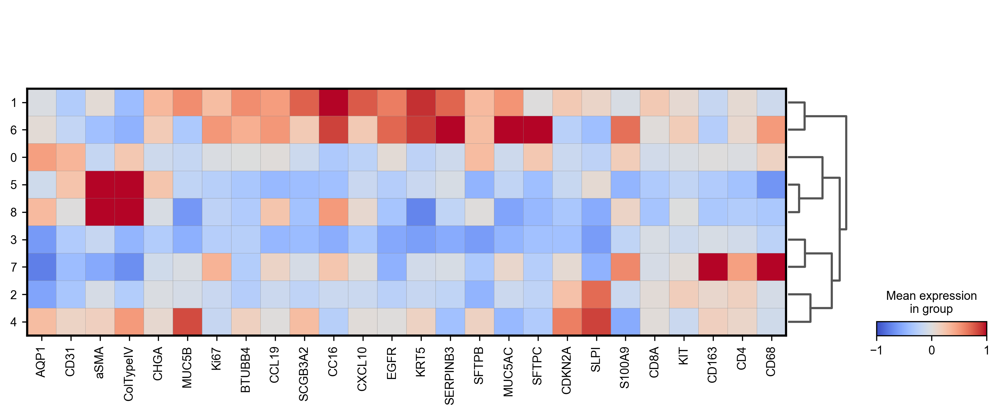

In [6]:
sc.settings.set_figure_params(dpi=150, fontsize=10)
sc.pl.matrixplot(
    results,
    var_names=var_order,
    groupby="UTAG Label_leiden_0.1",
    dendrogram=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    show=True,
    save="healthy_lung UTAG Expression",
)

Trying to set attribute `.uns` of view, copying.


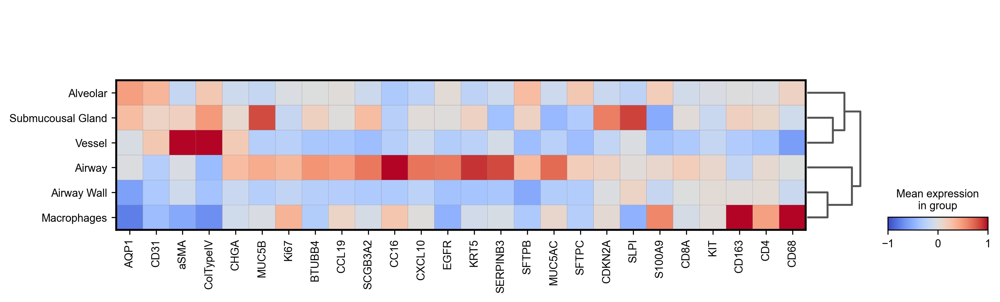

In [7]:
import seaborn as sns

utag_mapper = {
    "0": "Alveolar",
    "6": "Airway",
    "1": "Airway",
    "2": "Airway Wall",
    "3": "Airway Wall",
    "4": "Submucousal Gland",
    "5": "Vessel",
    "7": "Macrophages",
    "8": "Vessel",
}

results.obs["UTAG Label"] = pd.Categorical(
    results.obs["UTAG Label_leiden_0.1"].replace(utag_mapper)
)
results = results[~results.obs["UTAG Label"].isna()]


adata.obs["UTAG Label"] = results.obs["UTAG Label"]
adata.uns["UTAG Label_colors"] = sns.color_palette("tab10")[
    : len(adata.obs["UTAG Label"].unique())
]

results.uns["UTAG Label_colors"] = adata.uns["UTAG Label_colors"]

adata.obs["cell_type"] = adata.obs["cluster_0.5_label"].replace(
    {"Empty": "Low Expression"}
)
adata.uns["cell_type_colors"] = sns.color_palette("colorblind")[
    : len(adata.obs["cell_type"].unique())
]

sc.settings.set_figure_params(dpi=150, fontsize=10)
sc.pl.matrixplot(
    results,
    var_names=var_order,
    groupby="UTAG Label",
    dendrogram=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    show=True,
    save="healthy_lung_expression_annotated",
)

## UTAG Label UMAP

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

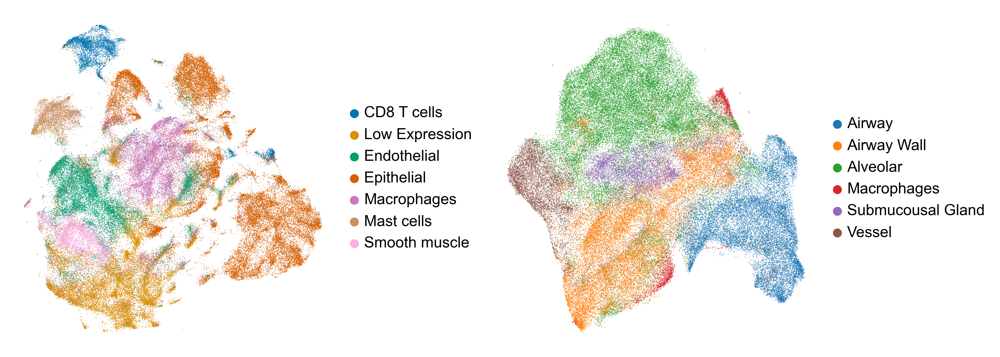

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(11, 4), dpi=150)
sc.pl.umap(
    adata,
    color="cell_type",
    title="",
    frameon=False,
    legend_fontsize=12,
    legend_fontoutline=1,
    show=False,
    ax=axs[0],
    size=1,
    legend_fontweight="normal",
)

sc.pl.umap(
    results,
    color="UTAG Label",
    title="",
    frameon=False,
    show=False,
    ax=axs[1],
    size=1,
    legend_fontsize=12,
    legend_fontoutline=1,
    legend_fontweight="normal",
)

plt.tight_layout()
plt.savefig("figures/healthy_lung Cell and Domain UMAP.pdf")

# Downstream Analysis With UTAG

## UTAG Micro-Anatomical Domain Cell Type Composition

C:\Users\jkim0\anaconda3\envs\utag\lib\site-packages\seaborn\axisgrid.py:643: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


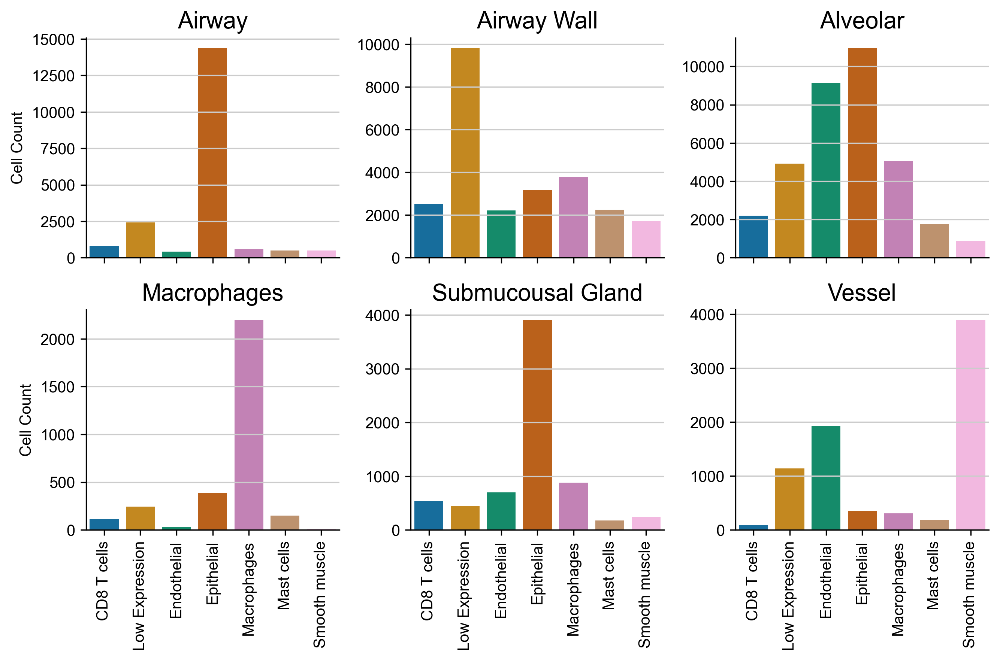

In [9]:
import seaborn as sns

g = sns.FacetGrid(
    data=adata.obs.groupby(["cell_type", "UTAG Label"]).count()["sample"].reset_index(),
    hue="cell_type",
    col="UTAG Label",
    col_wrap=3,
    aspect=1,
    palette="colorblind",
    sharey=False,
)

g.map(sns.barplot, "cell_type", "sample")

# iterate over axes of FacetGrid
for i, ax in enumerate(g.axes.flat):
    labels = ax.get_xticklabels()  # get x labels
    ax.set_xticklabels(labels, rotation=90, fontsize=10)  # set new labels
    titles = ax.get_title()
    titles = titles.replace("UTAG Label = ", "")
    ax.set_title(titles, fontsize=15)
    if i == 0 or i == 3:
        ax.set_ylabel("Cell Count", fontsize=10)
    else:
        ax.set_ylabel("", fontsize=12)
    ax.set_xlabel("")
plt.tight_layout()
plt.savefig("figures/healthy_lung_Domain Composition.pdf")

## Quantification of Cell-to-Cell Interaction within Micro-Anatomical Domain

In [10]:
import holoviews as hv

hv.extension("svg")
slide_key = "Slide"
celltype_key = "cell_type"
domain_key = "UTAG Label"
tmp = celltype_connectivity(
    adata=adata, slide_key=slide_key, domain_key=domain_key, celltype_key=celltype_key
)
glob_fig = []
for label in tmp.uns["UTAG Label_celltype_adjacency_matrix"].keys():
    fig = adj2chord(
        tmp.uns["UTAG Label_celltype_adjacency_matrix"][label].loc[
            adata.obs[celltype_key].cat.categories,
            adata.obs[celltype_key].cat.categories,
        ],
        size=100,
    )
    fig.opts(
        title=label,
        fontsize={"title": 20, "labels": 0, "xticks": 0, "yticks": 0, "legend": 0},
        labels=None,
        cmap="colorblind",
        edge_cmap=sns.color_palette("colorblind").as_hex()[:7],
        node_color=sns.color_palette("colorblind").as_hex()[:7],
    )
    glob_fig.append(fig)

display(
    (
        glob_fig[0]
        + glob_fig[2]
        + glob_fig[1]
        + glob_fig[4]
        + glob_fig[5]
        + glob_fig[3]
    ).cols(3)
)

hv.save(
    (
        glob_fig[0]
        + glob_fig[2]
        + glob_fig[1]
        + glob_fig[4]
        + glob_fig[5]
        + glob_fig[3]
    ).cols(3),
    "figures/healthy_lung_within_domain_celltype_interaction.pdf",
    fmt="pdf",
)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

100%|██████████| 38/38 [01:03<00:00,  1.68s/it]


:Layout
   .Chord.I   :Chord   [source,target]   (value)
   .Chord.II  :Chord   [source,target]   (value)
   .Chord.III :Chord   [source,target]   (value)
   .Chord.IV  :Chord   [source,target]   (value)
   .Chord.V   :Chord   [source,target]   (value)
   .Chord.VI  :Chord   [source,target]   (value)

## Visualization of Domain-Domain Interaction

In [11]:
results = domain_connectivity(results, slide_key="Slide", domain_key="UTAG Label")

100%|██████████| 38/38 [00:23<00:00,  1.64it/s]


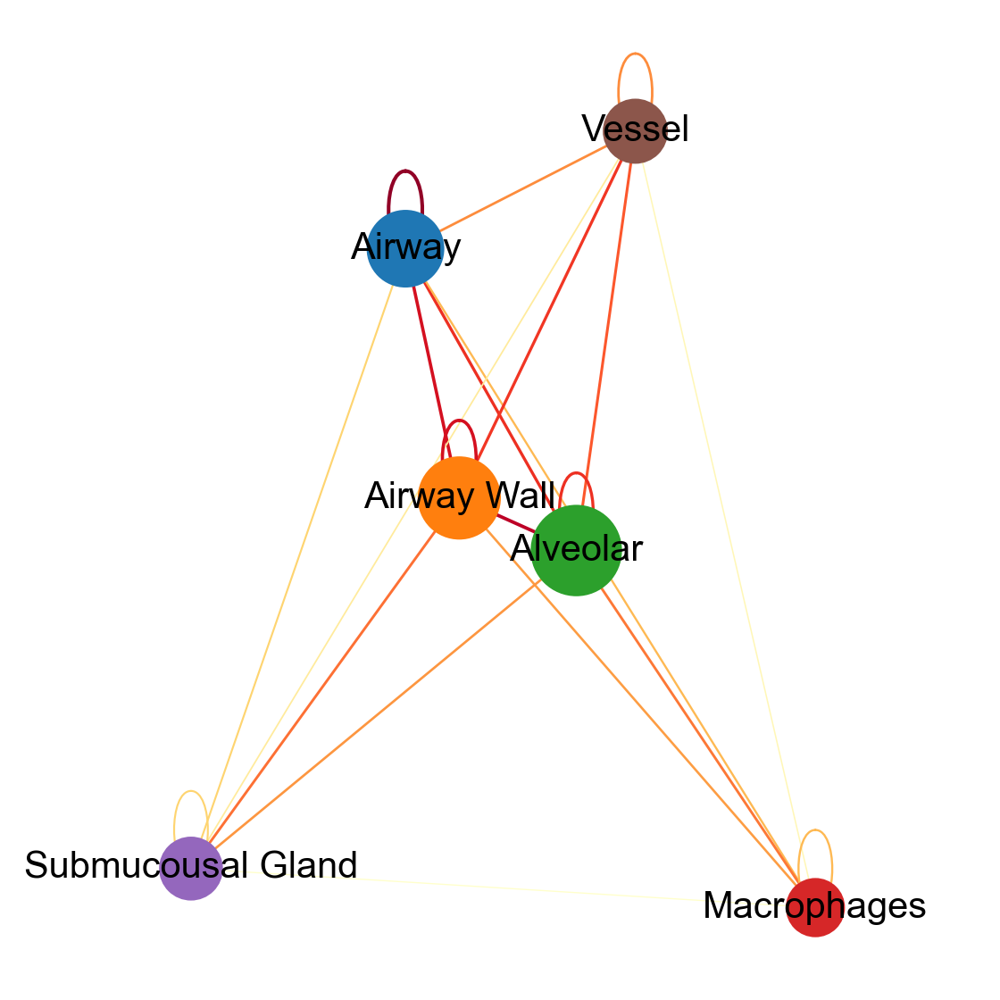

In [12]:
fig = draw_network(
    adata=results,
    font_size=30,
    edge_weight=2,
    edge_weight_baseline=1,
    dpi=50,
    node_size_max=5000,
    node_size_min=2000,
)

plt.savefig("figures/healthy_lung_Domain_network.pdf")

# Evaluation of Performance

In [13]:
adata = sc.read("data/healthy_lung_topological domain.h5ad")

In [14]:
import numpy as np

rng = np.random.default_rng(12345)

from sklearn.metrics import homogeneity_score, rand_score

random_rand_score_list = []
random_homogeneity_score_list = []

for key in adata.obs["slide"].unique():
    batch = adata[adata.obs["slide"] == key, :]

    rints = rng.integers(
        low=0, high=len(batch.obs["UTAG Label"].unique()), size=len(batch)
    ).astype(str)

    random_rand_score = rand_score(batch.obs["topolocial_domain_broad"], rints)
    random_homogeneity_score = homogeneity_score(
        batch.obs["topolocial_domain_broad"], rints
    )

    random_rand_score_list.append(random_rand_score)
    random_homogeneity_score_list.append(random_homogeneity_score)


rand_score_celltype = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="topolocial_domain_broad",
    pred_key="cell_type",
    method="rand",
)
rand_score_utag = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="topolocial_domain_broad",
    pred_key="UTAG Label",
    method="rand",
)

homogeneity_score_celltype = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="topolocial_domain_broad",
    pred_key="cell_type",
    method="homogeneity",
)
homogeneity_score_utag = evaluate_performance(
    adata,
    batch_key="slide",
    truth_key="topolocial_domain_broad",
    pred_key="UTAG Label",
    method="homogeneity",
)

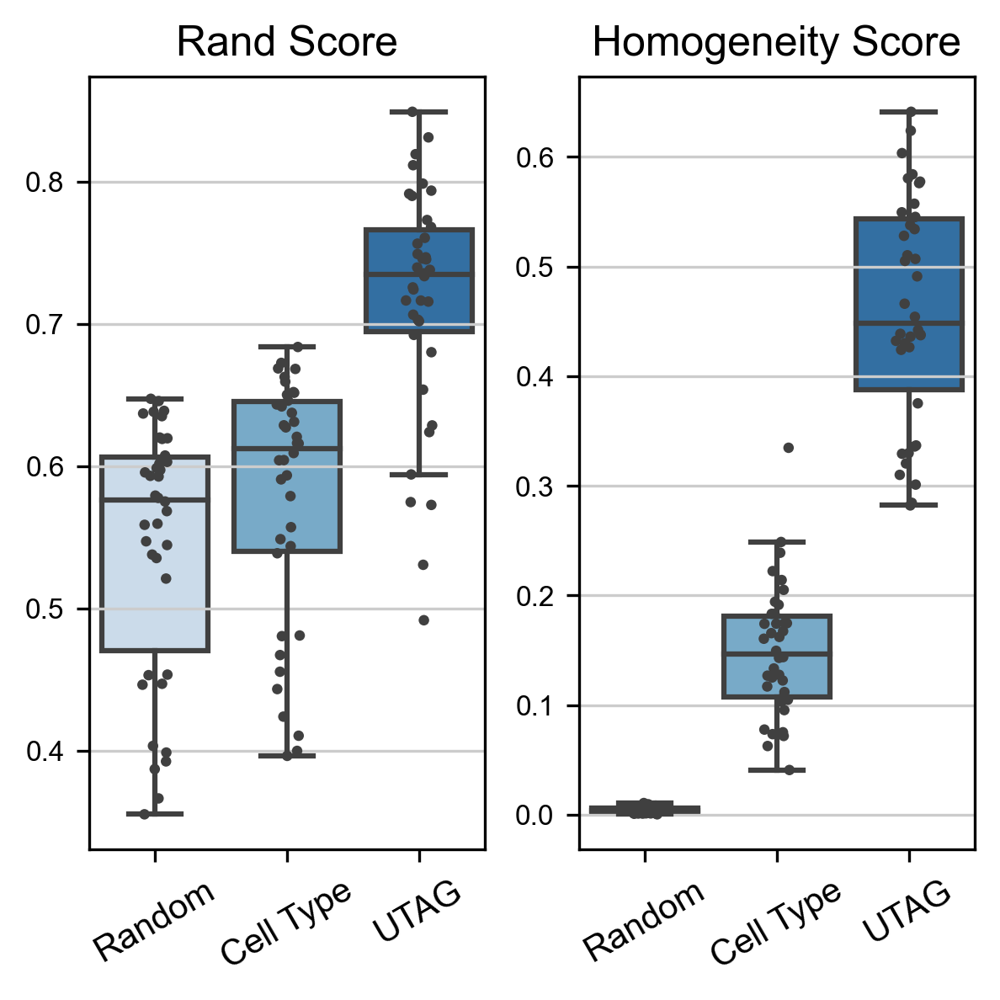

In [15]:
import seaborn as sns

sc.settings.set_figure_params(dpi=300, dpi_save=400, fontsize=8)
from sklearn.metrics import homogeneity_score, rand_score

rand_score_df = pd.DataFrame(
    {
        "Random": random_rand_score_list,
        "Cell Type": rand_score_celltype,
        "UTAG": rand_score_utag,
    }
)
homogeneity_score_df = pd.DataFrame(
    {
        "Random": random_homogeneity_score_list,
        "Cell Type": homogeneity_score_celltype,
        "UTAG": homogeneity_score_utag,
    }
)

fig, axs = plt.subplots(1, 2, figsize=(4, 4), dpi=150)

plt.subplot(1, 2, 1)
sns.boxplot(data=rand_score_df, palette="Blues", fliersize=0, ax=axs[0])
sns.stripplot(data=rand_score_df, color="0.25", s=3, ax=axs[0])
axs[0].set_title("Rand Score", fontsize=12)
axs[0].set_xticklabels(axs[0].get_xticklabels(), fontsize=10, rotation=30)

plt.subplot(1, 2, 2)
sns.boxplot(data=homogeneity_score_df, palette="Blues", fliersize=0, ax=axs[1])
sns.stripplot(data=homogeneity_score_df, color="0.25", s=3, ax=axs[1])
axs[1].set_title("Homogeneity Score", fontsize=12)
axs[1].set_xticklabels(axs[1].get_xticklabels(), fontsize=10, rotation=30)

plt.tight_layout()
plt.savefig("figures/healthy_lung_benchmark.pdf")
plt.show()

In [16]:
import pingouin as pg

print("Rand Score: Random vs UTAG")
display(
    pg.mwu(x=rand_score_df["Random"], y=rand_score_df["UTAG"], alternative="two-sided")
)
print("Rand Score: Cell Type vs UTAG")
display(
    pg.mwu(
        x=rand_score_df["Cell Type"], y=rand_score_df["UTAG"], alternative="two-sided"
    )
)
print("Homogeneity Score: Random vs UTAG")
display(
    pg.mwu(
        x=homogeneity_score_df["Random"],
        y=homogeneity_score_df["UTAG"],
        alternative="two-sided",
    )
)
print("Homogeneity Score: Cell Type vs UTAG")
display(
    pg.mwu(
        x=homogeneity_score_df["Cell Type"],
        y=homogeneity_score_df["UTAG"],
        alternative="two-sided",
    )
)

Rand Score: Random vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,122.0,two-sided,4.723299e-10,0.831025,0.084488


Rand Score: Cell Type vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,168.0,two-sided,8.916350e-09,0.767313,0.116343


Homogeneity Score: Random vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,0.0,two-sided,6.606879e-14,1.0,0.0


Homogeneity Score: Cell Type vs UTAG


,U-val,alternative,p-val,RBC,CLES
MWU,7.0,two-sided,1.147271e-13,0.990305,0.004848
